# Online learning in the Lorenz 96 framework

This notebooks contains all the experiments and figures for the online learning paper. Feel free to dive in, change some parameters and do your own experiments. All cells should run in a matter of minutes. Don't hesitate to open a Github issue if you have any questions!

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from L96 import *
from collections import deque
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import *
# Run this if you are using a GPU. Otherwise TF will use all your GPU memory...
# config = tf.ConfigProto()
# config.gpu_options.allow_growth=True
# sess = tf.Session(config=config)

In [3]:
# To make nice figures
sns.set_style('whitegrid')
sns.set_context('talk')
mpl.rcParams['figure.figsize'] = (7,6)
mpl.rcParams['lines.linewidth'] = 3

In [4]:
# Load initial conditions for L96 model
initX, initY = np.load('./data/initX.npy'), np.load('./data/initY.npy')
np.random.seed(123)

In [5]:
# Create a local figure folder 
!mkdir -p figures

## Reference/"true" linear regression and neural network

First, we will fit a linear regression and a neural network to a reference dataset created using the true parameters of the system.

The Lorenz model is contained in the L96TwoLevel class. It has some handy functionalities built in like a Xarray history file. Check out the class definition if you are interested.

In [6]:
# Create a Lorenz 96 two-level object and run for 50 time units
l96_ref = L96TwoLevel(X_init=initX, Y_init=initY, save_dt=0.001, noYhist=True)
l96_ref.iterate(50)

In [7]:
h = l96_ref.history   # xarray file

In [8]:
features = np.ravel(h.X.values)   # ML inputs
targets = np.ravel(h.B.values)    # ML outputs

In [9]:
features.shape, targets.shape

((1800036,), (1800036,))

### Linear regression

Fit a linear regression (a.k.a. a first order polynomial). These are our "true" parameters for linear regression

In [10]:
slope, intercept = np.polyfit(np.ravel(h.X.values), np.ravel(h.B.values), 1)
slope, intercept

(-0.3112771601245248, -0.19973845623403683)

### Neural network

Here, we will use a pretty simple neural network which is quite sufficient for the L96 parameterization task. Note that I did not do a lot of hyper-parameter testing for this paper. So feel free to play around with these settings.

In [199]:
true_nn = keras.models.Sequential([
    Dense(32, input_shape=(1,), activation='elu'),
    Dense(32, activation='elu'),
    Dense(1)
])

In [200]:
true_nn.compile('adam', 'mse')

In [201]:
true_nn.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_4 (Dense)              (None, 32)                64        
_________________________________________________________________
dense_5 (Dense)              (None, 32)                1056      
_________________________________________________________________
dense_6 (Dense)              (None, 1)                 33        
Total params: 1,153
Trainable params: 1,153
Non-trainable params: 0
_________________________________________________________________


In [202]:
# Should take around half a minute
true_nn.fit(features, targets, epochs=2, verbose=1, batch_size=1024);

Epoch 1/2
1800036/1800036 [==============================] - 14s 8us/sample - loss: 0.2903
Epoch 2/2
1800036/1800036 [==============================] - 13s 7us/sample - loss: 0.2845


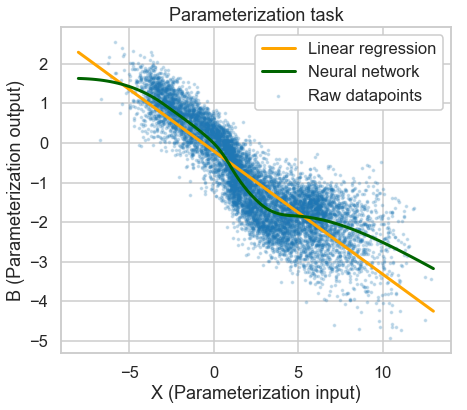

In [203]:
plt.scatter(features[::200], targets[::200], s=5, alpha=0.2, label='Raw datapoints');
plt.xlabel('X (Parameterization input)')
plt.ylabel('B (Parameterization output)')
plt.title('Parameterization task')
a = np.linspace(-8, 13, 100)
plt.plot(a, np.polyval((slope, intercept), a), label='Linear regression', c='orange')
plt.plot(a, true_nn.predict(a), label='Neural network', c='darkgreen')
plt.legend(framealpha=1);
#plt.savefig('figures/X-B-True.pdf', bbox_inches='tight')

## Create "wrong" linear regression with Keras

For online learning we assume that we do not have to completely start from scratch. We can always learn in a supervised manner, e.g. from a traditional parameterization or a coarse grained dataset.

To emulate this "starting point" in the L96 setup, we will run a simulation with "wrong" parameters and use this simulation to train out initial machine learning methods.

In [11]:
l96_wrong = L96TwoLevel(
    X_init=initX, Y_init=initY, 
    F=7,   # default = 10
    h=2,   # default = 1
    c=5,   # default = 10
    b=5,   # default = 10
    noYhist=True
)

In [12]:
l96_wrong.iterate(20)

In [13]:
features_wrong = np.ravel(l96_wrong.history.X.values)
targets_wrong = np.ravel(l96_wrong.history.B.values)

In [14]:
features_wrong.shape

(7236,)

In [15]:
slope_wrong, intercept_wrong = np.polyfit(features_wrong, targets_wrong, 1)
slope_wrong, intercept_wrong

(-0.7482297839541219, -0.38580039259452187)

In [16]:
wrong_nn = keras.models.Sequential([
    Dense(32, input_shape=(1,), activation='elu'),
    Dense(32, activation='elu'),
    Dense(1)
])

Instructions for updating:
Colocations handled automatically by placer.


In [25]:
wrong_nn.compile('adam', 'mse')

In [26]:
# Should take around half a minute
wrong_nn.fit(features_wrong, targets_wrong, epochs=30, verbose=0);

In [27]:
# Save the neural network parameters so we can load them again
wrong_nn.save('./nn.h5')

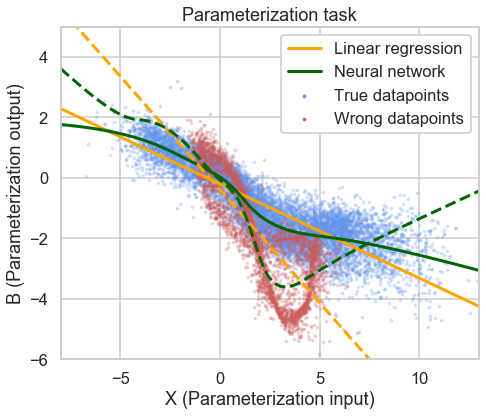

In [28]:
plt.scatter(features[::200], targets[::200], s=5, alpha=0.2, color='cornflowerblue');
plt.scatter(features_wrong[::2], targets_wrong[::2], s=5, alpha=0.2, color='indianred');
plt.scatter([999], [999], s=5, label='True datapoints', color='cornflowerblue')
plt.scatter([999], [999], s=5, label='Wrong datapoints', color='indianred')
plt.xlabel('X (Parameterization input)')
plt.ylabel('B (Parameterization output)')
plt.title('Parameterization task')
a = np.linspace(-8, 13, 100)
plt.plot(a, np.polyval((slope, intercept), a), label='Linear regression', c='orange')
plt.plot(a, true_nn.predict(a), label='Neural network', c='darkgreen')

plt.plot(a, np.polyval((slope_wrong, intercept_wrong), a), 
         c='orange', ls='--')
plt.plot(a, wrong_nn.predict(a), c='darkgreen', ls='--')
plt.ylim(-6, 5); plt.xlim(-8, 13)
plt.legend(framealpha=1);
plt.subplots_adjust(bottom=0.15, right=0.98, top=0.92, left=0.15)
plt.savefig('figures/X-B-True-Wrong.pdf')

### Linear regression in Keras

To be able to learn the linear regression parameters online we will create a linear regression network in Keras.

In [17]:
lr_net = keras.models.Sequential([
    Dense(1, input_shape=(1,))
])

In [18]:
learning_rate = 0.001
lr_net.compile(tf.keras.optimizers.Adam(learning_rate), 'mse')

Instructions for updating:
Use tf.cast instead.


In [19]:
# No need for validation, etc, since we are simply interested in a "wrong" starting point
lr_net.fit(features_wrong, targets_wrong, epochs=30, verbose=0);

Instructions for updating:
Use tf.cast instead.


In [20]:
l = lr_net.layers[0]

In [21]:
# Check whether we get roughly the same results as the polyfit method. 
# Small differences are ok.
l.get_weights(), slope_wrong, intercept_wrong

([array([[-0.74140346]], dtype=float32), array([-0.38499308], dtype=float32)],
 -0.7482297839541219,
 -0.38580039259452187)

In [22]:
# Again, save for reuse later
lr_net.save('./lr.h5')

In [23]:
# Note that we are technically not using this in online learning
class NNParam():
    """Parameterization class that can be used inside a L96 object"""
    def __init__(self, keras_net):
        self.net = keras_net
    def __call__(self, x):
        return self.net.predict_on_batch(x).squeeze(-1)

## Online learning experiments with linear regression

Now we have all the ingredients to run online learning experiments. For convenient experimentation we will create a class. This class essentially corresponds to Algorithm 1 in the paper.

Here we will go through several setups in order of increasing complexity.

In [55]:
import pdb

In [61]:
class OnlineLearning():
    """Class for convenient experimentation. See Algorithm 1."""
    def __init__(self, l96_ml, l96_crm, update_frequency=1, dt_factor=1, capacity=None, 
                 bs=None, nudging_dt=0.001):
        self.l96_ml, self.l96_crm = l96_ml, l96_crm
        self.update_frequency, self.dt_factor = update_frequency, dt_factor
        self.nudging_dt = nudging_dt
        self.diff_history, self.loss_history, self.parameter_history = [], [], []
        self.bs = l96_ml.K * update_frequency if bs is None else bs
        if capacity is None: capacity = l96_ml.K * update_frequency
        self.feature_memory = deque(maxlen=capacity) 
        self.target_memory = deque(maxlen=capacity)
        self.all_features, self.all_targets = [], []
        
    def iterate(self, nsteps):
        for i in tqdm(range(nsteps)):
            # Compute the difference
            diff = self.l96_crm.X - self.l96_ml.X
            CRM_before = self.l96_crm.X.copy()
            self.diff_history.append(diff)
#             pdb.set_trace()
            # Apply the difference divied by the time step as an extra forcing for the CRM
            self.l96_crm.F = 10 - diff / self.nudging_dt
            # Integrate the CRM forward one ML time step
            for _ in range(self.dt_factor): self.l96_crm.step()
            
            # Now integrate the NN model forward. This evolves only X without the parameterization term B.
            ML_before = self.l96_ml.X.copy()
            self.l96_ml.step(add_B=False)
            delta_dyn = self.l96_ml.X - ML_before
            feature = ML_before.copy()
            self.feature_memory.extend(feature); self.all_features.extend(feature)
            
            # Get the ML parameterization output
            B = l96_ml.parameterization(feature)
            
            # Soft target
            delta_CRM = self.l96_crm.X - CRM_before
            delta_nudge = -(diff / self.nudging_dt * self.l96_crm.dt * self.dt_factor)
            delta_CRM_true = delta_CRM - delta_nudge
            
            target = (delta_CRM_true - delta_dyn) / self.l96_ml.dt
            
            self.target_memory.extend(target); self.all_targets.extend(target)
            # Add the parameterization term after computing the target
            self.l96_ml.X += B * self.l96_ml.dt
            
            if i % self.update_frequency == 0:
                # Train the neural network.
                features = np.array(self.feature_memory)
                targets = np.array(self.target_memory)
                loss = ml_param.net.fit(features, targets, epochs=1, batch_size=self.bs, verbose=0)
                self.loss_history.append(loss)
                self.parameter_history.append(ml_param.net.get_weights())

In [24]:
h

<xarray.Dataset>
Dimensions:  (time: 50001, x: 36, y: 360)
Coordinates:
  * time     (time) float64 0.0 0.001 0.002 0.003 0.004 ... 50.0 50.0 50.0 50.0
  * x        (x) int64 0 1 2 3 4 5 6 7 8 9 10 ... 26 27 28 29 30 31 32 33 34 35
  * y        (y) int64 0 1 2 3 4 5 6 7 8 ... 351 352 353 354 355 356 357 358 359
Data variables:
    X        (time, x) float64 7.222 2.999 1.425 3.226 ... 3.663 5.398 1.64
    B        (time, x) float64 -3.124 -1.743 -0.7543 ... -1.103 -1.98 -1.54
    Y_mean   (time, x) float64 0.3124 0.1743 0.07543 ... 0.1111 0.1964 0.154
    Y2_mean  (time, x) float64 0.19 0.05604 0.006333 ... 0.05584 0.08911 0.0278

In [72]:
l96_ml = L96TwoLevel(
    integration_type='uncoupled', 
    X_init=h.X.isel(time=-1).values, 
    Y_init=initY, dt=0.001, 
    noYhist=True,
    save_dt=0.001
)
# This is the true model (aka the CRM) that will be nudged
l96_crm = L96TwoLevel(
    integration_type='uncoupled', 
    X_init=initX, 
    Y_init=initY, 
    save_dt=0.001, 
    noYhist=True
)

In [51]:
ol = OnlineLearning(l96_ml, l96_crm, nudging_dt=0.001 * 50)

In [52]:
ol.iterate(100)

In [53]:
h_crm = ol.l96_crm.history
h_ml = ol.l96_ml.history

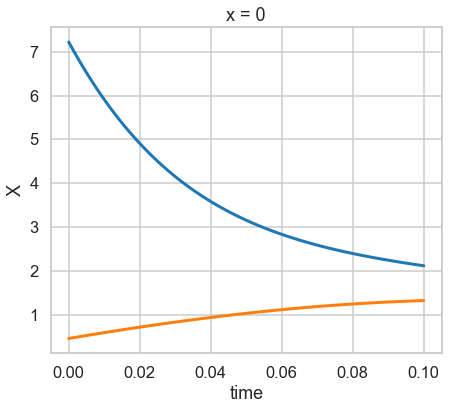

In [54]:
h_crm.X.isel(x=0).plot()
h_ml.X.isel(x=0).plot()

### Simplest setup: same time step, immediate updates

The first setup is using the same time step for the CRM and the ML-GCM model and updating the network parameters every time step.

In [74]:
# Load the "wrongly" pretrained model
lr_net = keras.models.load_model('./lr.h5')
lr_net.optimizer.lr = 0.001
ml_param = NNParam(lr_net)

In [75]:
# Create the two models
# This is the machine learning model. Either linear regression or a neural network
l96_ml = L96TwoLevel(
    parameterization=ml_param, 
    X_init=h.X.isel(time=10).values, 
    Y_init=initY, 
    dt=0.001, 
    noYhist=True
)
# This is the true model (aka the CRM) that will be nudged
l96_crm = L96TwoLevel(
    integration_type='uncoupled', 
    X_init=initX, 
    Y_init=initY, 
    save_dt=0.001, 
    noYhist=True
)

In [76]:
ol = OnlineLearning(l96_ml, l96_crm)

In [77]:
ol.iterate(10000)

In [78]:
# Check how differences between the ML model and the "CRM" decrease
diffs = np.array(ol.diff_history); diffs.shape

(10000, 36)

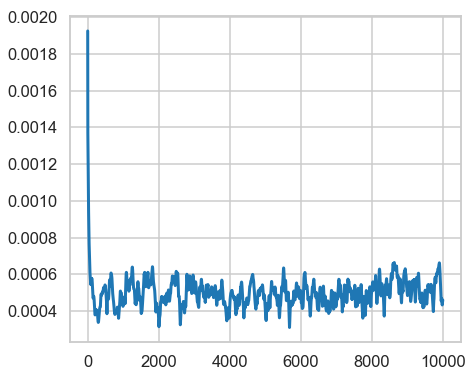

In [79]:
plt.plot(np.abs(diffs).mean(1)[1:])

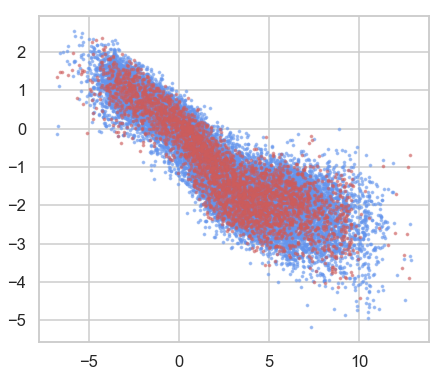

In [80]:
# Check what the network is learning
plt.scatter(features[::100], targets[::100], s=5, alpha=0.5, color='cornflowerblue');
plt.scatter(ol.all_features[::100], ol.all_targets[::100], s=5, alpha=0.5, color='indianred');

In [81]:
np.polyfit(ol.all_features, ol.all_targets, 1), slope, intercept

(array([-0.31647179, -0.19503033]), -0.3112771601245248, -0.19973845623403683)

Here we can see that the online targets are representative of the "true" targets.

In [82]:
# Check how the parameters
parameters = np.array(ol.parameter_history).squeeze(); parameters.shape

(10000, 2)

Text(0.5, 1.0, 'Online learning')

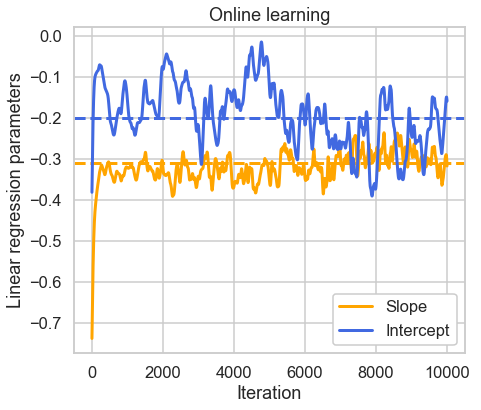

In [83]:
plt.plot(parameters[:, 0], c='orange', label='Slope')
plt.axhline(slope, c='orange', ls='--')
plt.plot(parameters[:, 1], c='royalblue', label='Intercept')
plt.axhline(intercept, c='royalblue', ls='--')
plt.xlabel('Iteration')
plt.ylabel('Linear regression parameters')
plt.legend(framealpha=1)
plt.title('Online learning')

So the algorithm works, but the results are rather jittery. This makes sense since we are updating every iteration with correlated samples. So the network is continuously pushed one way or another. One way to combat this might be to reduce the learning rate. Another though is to update only every few time steps, which we will do further below.

### Same with soft nudging

In [95]:
# Load the "wrongly" pretrained model
lr_net = keras.models.load_model('./lr.h5')
lr_net.optimizer.lr = 0.001
ml_param = NNParam(lr_net)

In [96]:
# Create the two models
# This is the machine learning model. Either linear regression or a neural network
l96_ml = L96TwoLevel(
    parameterization=ml_param, 
    X_init=h.X.isel(time=10).values, 
    Y_init=initY, 
    dt=0.001, 
    noYhist=True
)
# This is the true model (aka the CRM) that will be nudged
l96_crm = L96TwoLevel(
    integration_type='uncoupled', 
    X_init=initX, 
    Y_init=initY, 
    save_dt=0.001, 
    noYhist=True
)

In [97]:
ol = OnlineLearning(l96_ml, l96_crm, nudging_dt=0.001 * 10)

In [98]:
ol.iterate(10000)

In [99]:
# Check how differences between the ML model and the "CRM" decrease
diffs = np.array(ol.diff_history); diffs.shape

(10000, 36)

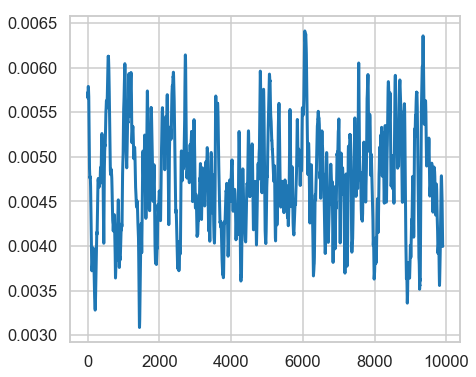

In [100]:
plt.plot(np.abs(diffs).mean(1)[100:])

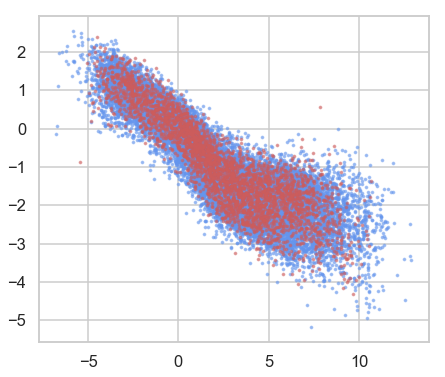

In [101]:
# Check what the network is learning
plt.scatter(features[::100], targets[::100], s=5, alpha=0.5, color='cornflowerblue');
plt.scatter(ol.all_features[::100], ol.all_targets[::100], s=5, alpha=0.5, color='indianred');

In [102]:
np.polyfit(ol.all_features, ol.all_targets, 1), slope, intercept

(array([-0.31420624, -0.18034209]), -0.3112771601245248, -0.19973845623403683)

Here we can see that the online targets are representative of the "true" targets.

In [103]:
# Check how the parameters
parameters = np.array(ol.parameter_history).squeeze(); parameters.shape

(10000, 2)

Text(0.5, 1.0, 'Online learning')

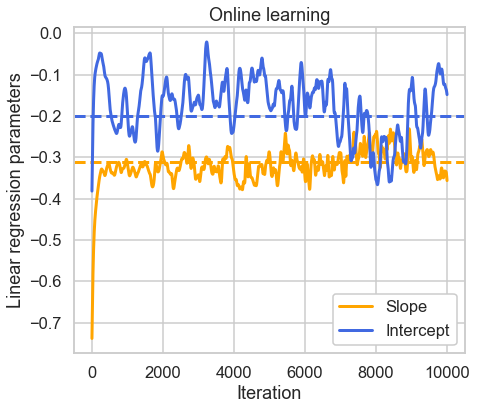

In [104]:
plt.plot(parameters[:, 0], c='orange', label='Slope')
plt.axhline(slope, c='orange', ls='--')
plt.plot(parameters[:, 1], c='royalblue', label='Intercept')
plt.axhline(intercept, c='royalblue', ls='--')
plt.xlabel('Iteration')
plt.ylabel('Linear regression parameters')
plt.legend(framealpha=1)
plt.title('Online learning')

### CRM has smaller time step

This is a much more realistic setup. The forcing then is continuously applied as the CRM completes several time steps to catch up with one GCM time step.

In [105]:
# Load the "wrongly" pretrained model
lr_net = keras.models.load_model('./lr.h5')
lr_net.optimizer.lr = 0.001
ml_param = NNParam(lr_net)

In [106]:
# Create the two models
# This is the machine learning model. Either linear regression or a neural network
l96_ml = L96TwoLevel(parameterization=ml_param, X_init=initX, Y_init=initY, dt=0.01, noYhist=True)
# This is the true model (aka the CRM) that will be nudged
l96_crm = L96TwoLevel(integration_type='uncoupled', X_init=initX, Y_init=initY, save_dt=0.001, noYhist=True)

In [107]:
ol2 = OnlineLearning(l96_ml, l96_crm, dt_factor=10, nudging_dt=0.01 * 10)

In [108]:
# This can now take a minute or two since the CRM has to do ten times as many steps
ol2.iterate(10000)

In [109]:
# Check how differences between the ML model and the "CRM" decrease
diffs = np.array(ol2.diff_history); diffs.shape

(10000, 36)

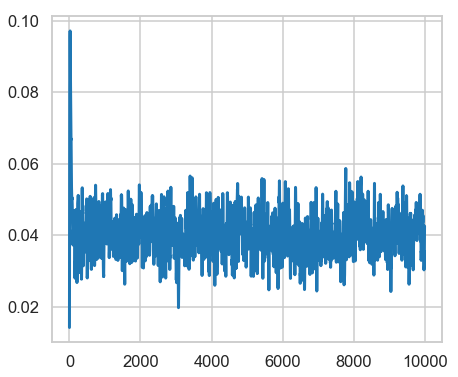

In [110]:
plt.plot(np.abs(diffs).mean(1)[1:])

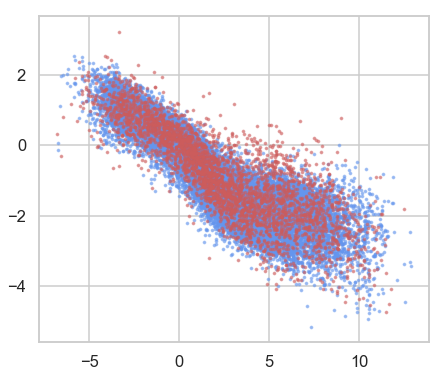

In [111]:
# Check what the network is learning
plt.scatter(features[::100], targets[::100], s=5, alpha=0.5, color='cornflowerblue');
plt.scatter(ol2.all_features[::100], ol2.all_targets[::100], s=5, alpha=0.5, color='indianred');

In [112]:
np.polyfit(ol2.all_features, ol2.all_targets, 1), slope, intercept

(array([-0.2877208 , -0.12871737]), -0.3112771601245248, -0.19973845623403683)

Now what we can see is that the bias actually seems to be a little different from the "true" value. This might be because the assumption that the forcing and the CRM response are actually not linear superpositions. The differences are very small however.

In [113]:
# Check how the parameters
parameters = np.array(ol2.parameter_history).squeeze(); parameters.shape

(10000, 2)

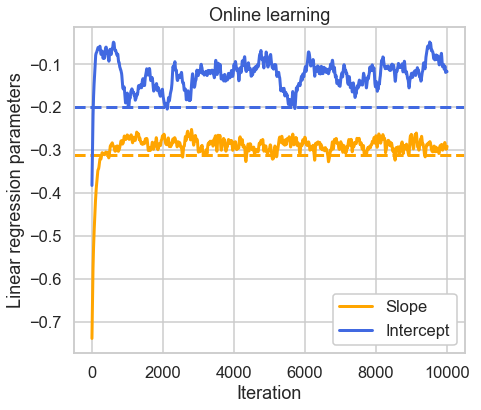

In [114]:
plt.plot(parameters[:, 0], c='orange', label='Slope')
plt.axhline(slope, c='orange', ls='--')
plt.plot(parameters[:, 1], c='royalblue', label='Intercept')
plt.axhline(intercept, c='royalblue', ls='--')
plt.xlabel('Iteration')
plt.ylabel('Linear regression parameters')
plt.legend(framealpha=1)
plt.title('Online learning');

The bias is still quite jittery.

### Updates every few time steps

We do not have to update every tim. In fact, we might not want to pull the ML parameterization too much to the actual state. Rather we can let the models run for a few time steps without a gradient descent step.

In [115]:
# Load the "wrongly" pretrained model
lr_net = keras.models.load_model('./lr.h5')
lr_net.optimizer.lr = 0.001
ml_param = NNParam(lr_net)

In [116]:
# Create the two models
# This is the machine learning model. Either linear regression or a neural network
l96_ml = L96TwoLevel(parameterization=ml_param, X_init=initX, Y_init=initY, dt=0.01, noYhist=True)
# This is the true model (aka the CRM) that will be nudged
l96_crm = L96TwoLevel(integration_type='uncoupled', X_init=initX, Y_init=initY, save_dt=0.001, noYhist=True)

In [117]:
ol3 = OnlineLearning(l96_ml, l96_crm, dt_factor=10, update_frequency=10, bs=128, nudging_dt = 0.01*10)

In [118]:
# This can now take a minute or two since the CRM has to do ten times as many steps
ol3.iterate(10000)

In [126]:
h_crm = ol3.l96_crm.history
h_ml = ol3.l96_ml.history

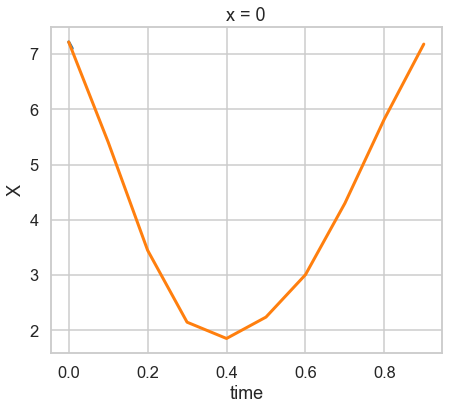

In [129]:
h_crm.X.isel(x=0)[:10].plot()
h_ml.X.isel(x=0)[:10].plot()

In [119]:
len(ol3.feature_memory)

360

In [120]:
# Check how differences between the ML model and the "CRM" decrease
diffs = np.array(ol3.diff_history); diffs.shape

(10000, 36)

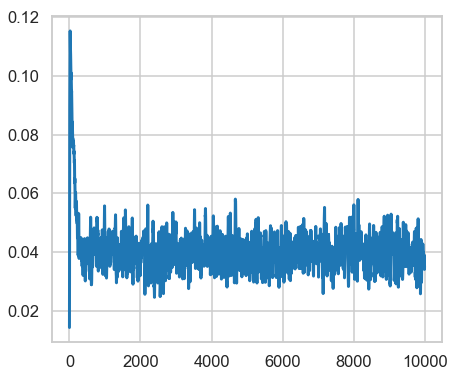

In [121]:
plt.plot(np.abs(diffs).mean(1)[1:])

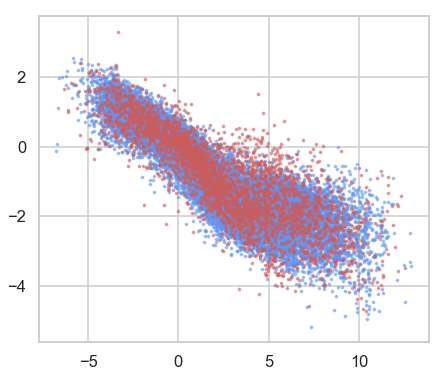

In [122]:
# Check what the network is learning
plt.scatter(features[::100], targets[::100], s=5, alpha=0.5, color='cornflowerblue');
plt.scatter(ol3.all_features[::100], ol3.all_targets[::100], s=5, alpha=0.5, color='indianred');

In [123]:
online_slope, online_intercept = np.polyfit(ol3.all_features, ol3.all_targets, 1)
online_slope, online_intercept, slope, intercept

(-0.2889149599505682,
 -0.14198028588445952,
 -0.3112771601245248,
 -0.19973845623403683)

Note that the bias has changed a little further. This might be evidence that updating every few time steps makes some of the linearity assumptions a little less valid. But again, the difference is tiny.

In [124]:
# Check how the parameters
parameters = np.array(ol3.parameter_history).squeeze(); parameters.shape

(1000, 2)

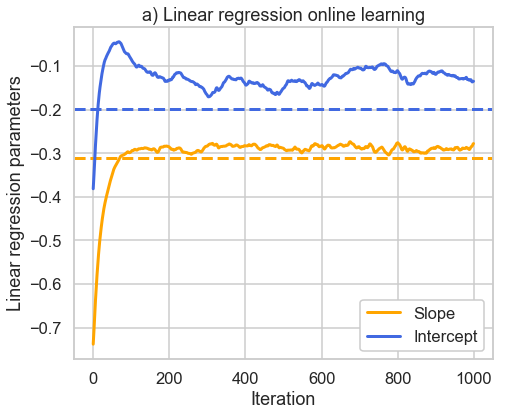

In [125]:
plt.plot(parameters[:, 0], c='orange', label='Slope')
plt.axhline(slope, c='orange', ls='--')
plt.plot(parameters[:, 1], c='royalblue', label='Intercept')
plt.axhline(intercept, c='royalblue', ls='--')
#plt.axhline(online_intercept, c='royalblue', ls='--', alpha=0.5)
plt.xlabel('Iteration')
plt.ylabel('Linear regression parameters')
plt.legend(framealpha=1)
plt.title('a) Linear regression online learning');
plt.subplots_adjust(bottom=0.15, right=0.98, top=0.92, left=0.15)
plt.savefig('figures/LR-params.pdf')

This is now much smoother. The intercept does not approach the "true value" for reasons mentioned above. 

### Test sensitivity to nudging time scale

In [167]:
# Load the "wrongly" pretrained model
lr_net = keras.models.load_model('./lr.h5')
lr_net.optimizer.lr = 0.001
ml_param = NNParam(lr_net)

In [168]:
# Create the two models
# This is the machine learning model. Either linear regression or a neural network
l96_ml = L96TwoLevel(parameterization=ml_param, X_init=initX, Y_init=initY, dt=0.01, noYhist=True)
# This is the true model (aka the CRM) that will be nudged
l96_crm = L96TwoLevel(integration_type='uncoupled', X_init=initX, Y_init=initY, save_dt=0.001, noYhist=True)

In [169]:
ol4 = OnlineLearning(l96_ml, l96_crm, dt_factor=10, update_frequency=10, bs=128, nudging_dt = 0.01*20)

In [181]:
# This can now take a minute or two since the CRM has to do ten times as many steps
ol4.iterate(5000)

In [182]:
h_crm = ol4.l96_crm.history
h_ml = ol4.l96_ml.history

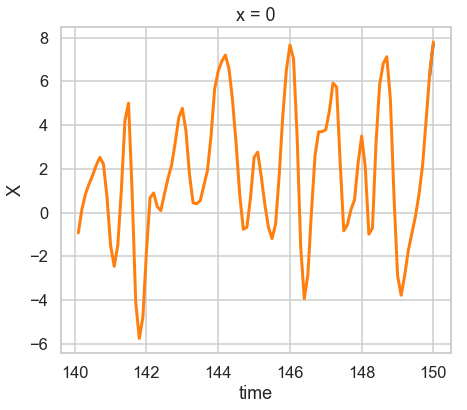

In [183]:
h_crm.X.isel(x=0)[-100:].plot()
h_ml.X.isel(x=0)[-100:].plot()

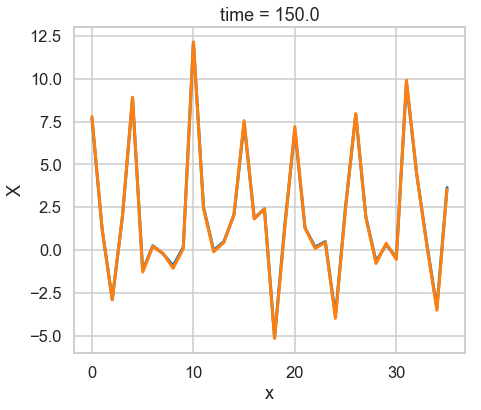

In [184]:
h_crm.X.isel(time=-1).plot()
h_ml.X.isel(time=-1).plot()

In [185]:
len(ol4.feature_memory)

360

In [186]:
# Check how differences between the ML model and the "CRM" decrease
diffs = np.array(ol4.diff_history); diffs.shape

(15000, 36)

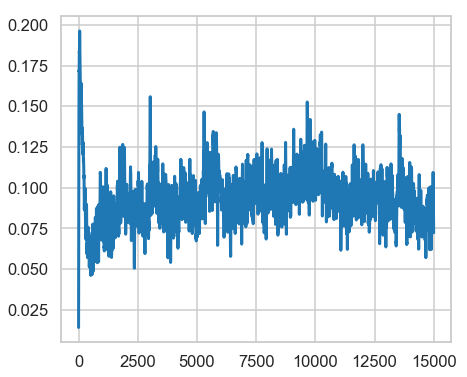

In [187]:
plt.plot(np.abs(diffs).mean(1)[1:])

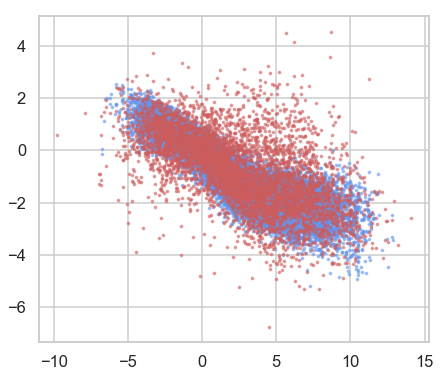

In [188]:
# Check what the network is learning
plt.scatter(features[::100], targets[::100], s=5, alpha=0.5, color='cornflowerblue');
plt.scatter(ol4.all_features[::100], ol4.all_targets[::100], s=5, alpha=0.5, color='indianred');

In [189]:
online_slope, online_intercept = np.polyfit(ol4.all_features, ol4.all_targets, 1)
online_slope, online_intercept, slope, intercept

(-0.2206321966019368,
 -0.1910792504723119,
 -0.3112771601245248,
 -0.19973845623403683)

In [190]:
# Check how the parameters
parameters = np.array(ol4.parameter_history).squeeze(); parameters.shape

(1500, 2)

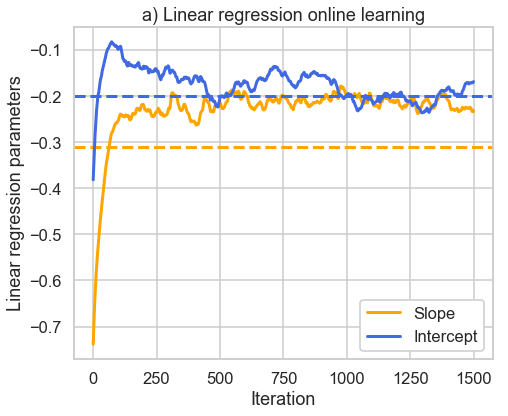

In [191]:
plt.plot(parameters[:, 0], c='orange', label='Slope')
plt.axhline(slope, c='orange', ls='--')
plt.plot(parameters[:, 1], c='royalblue', label='Intercept')
plt.axhline(intercept, c='royalblue', ls='--')
#plt.axhline(online_intercept, c='royalblue', ls='--', alpha=0.5)
plt.xlabel('Iteration')
plt.ylabel('Linear regression parameters')
plt.legend(framealpha=1)
plt.title('a) Linear regression online learning');
plt.subplots_adjust(bottom=0.15, right=0.98, top=0.92, left=0.15)
plt.savefig('figures/LR-params.pdf')

### Off-policy learning

This term is stolen from reinforcement learning literature. As we have seen in the figures above, the features and targets are always "true" representations of the parameterization task, independent of the current policy/parameterization that created them. 

This means that we can learn not only from the features and targets since the last gradient descent update but also from previous iterations. Theoretically, one could assume that this would lead to smoother updates and lead to more rubust training.

In [65]:
# Load the "wrongly" pretrained model
lr_net = keras.models.load_model('./lr.h5')
lr_net.optimizer.lr = 0.001
ml_param = NNParam(lr_net)

In [66]:
# Create the two models
# This is the machine learning model. Either linear regression or a neural network
l96_ml = L96TwoLevel(parameterization=ml_param, X_init=initX, Y_init=initY, dt=0.01, noYhist=True)
# This is the true model (aka the CRM) that will be nudged
l96_crm = L96TwoLevel(integration_type='uncoupled', X_init=initX, Y_init=initY, save_dt=0.001, noYhist=True)

In [67]:
ol4 = OnlineLearning(l96_ml, l96_crm, dt_factor=10, update_frequency=1, 
                     capacity=l96_ml.K * 10, bs=128)

In [68]:
len(ol3.feature_memory),len(ol4.feature_memory)

(360, 0)

In [69]:
# This of course takes longer now since we have several batches per update. 
# In a real CRM the gradient descent update would be insigificant compared to the CRM integration.
ol4.iterate(3000)

In [70]:
# Check how differences between the ML model and the "CRM" decrease
diffs = np.array(ol4.diff_history); diffs.shape

(3000, 36)

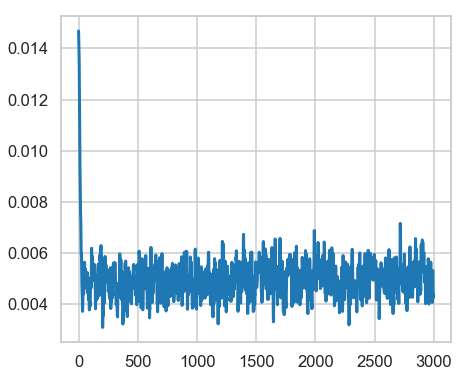

In [71]:
plt.plot(np.abs(diffs).mean(1)[1:])

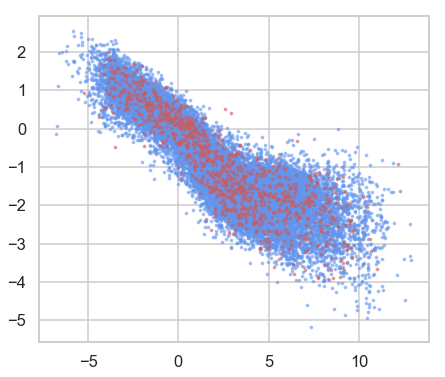

In [72]:
# Check what the network is learning
plt.scatter(features[::100], targets[::100], s=5, alpha=0.5, color='cornflowerblue');
plt.scatter(ol4.all_features[::100], ol4.all_targets[::100], s=5, alpha=0.5, color='indianred');

In [73]:
np.polyfit(ol4.all_features, ol4.all_targets, 1)

array([-0.31801868, -0.15309908])

Now what we can see is that the bias actually seems to be a little different from the "true" value. This might be because the assumption that the forcing and the CRM response are actually not linear superpositions. The differences are very small however.

In [74]:
# Check how the parameters
parameters = np.array(ol4.parameter_history).squeeze(); parameters.shape

(3000, 2)

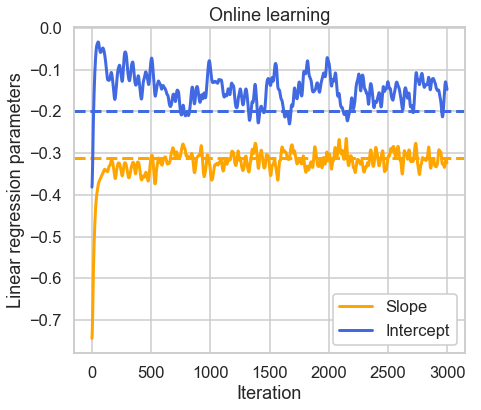

In [75]:
plt.plot(parameters[:, 0], c='orange', label='Slope')
plt.axhline(slope, c='orange', ls='--')
plt.plot(parameters[:, 1], c='royalblue', label='Intercept')
plt.axhline(intercept, c='royalblue', ls='--')
plt.xlabel('Iteration')
plt.ylabel('Linear regression parameters')
plt.legend(framealpha=1)
plt.title('Online learning');
#plt.savefig('figures/LR-params-off-policy.pdf', bbox_inches='tight')

Somehow this is more jittery than the on-policy version with updates every ten time steps. I am not sure why. Maybe I made a mistake or I am missing something? I did not include this in the paper but maybe this should be investigated again...

## Online learning with a neural network

Now we will use our neural network from above and train that online. We will use a combination of the setups from above. Note, of course, that the is much room for fine-tuning. However, the exact setting are probably very dependent on the modeling setup.

In [204]:
# Load the "wrongly" pretrained model
nn = keras.models.load_model('./nn.h5')
ml_param = NNParam(nn)

In [205]:
# Create the two models
# This is the machine learning model. Either linear regression or a neural network
l96_ml = L96TwoLevel(parameterization=ml_param, X_init=initX, Y_init=initY, dt=0.01, noYhist=True)
# This is the true model (aka the CRM) that will be nudged
l96_crm = L96TwoLevel(integration_type='uncoupled', X_init=initX, Y_init=initY, save_dt=0.001, noYhist=True)

In [206]:
ol5 = OnlineLearning(l96_ml, l96_crm, update_frequency=10, dt_factor=10, nudging_dt=0.01*10)

In [207]:
ol5.iterate(10000)

In [208]:
# Check how differences between the ML model and the "CRM" decrease
diffs = np.array(ol5.diff_history); diffs.shape

(10000, 36)

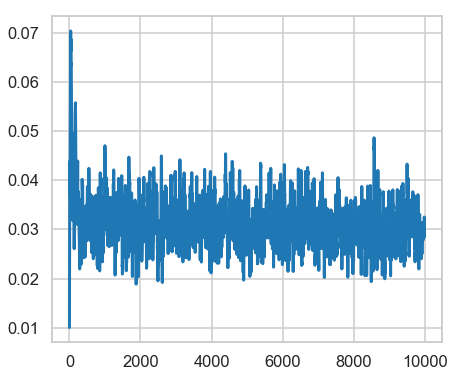

In [209]:
plt.plot(np.abs(diffs).mean(1)[1:])

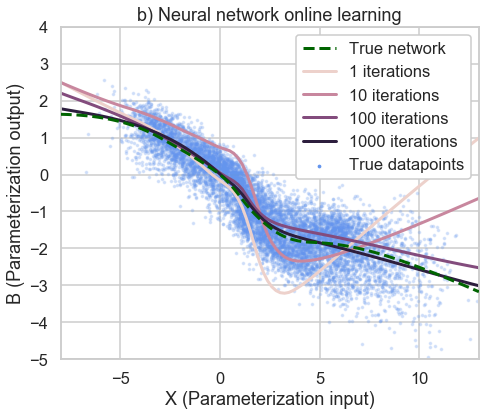

In [210]:
plt.scatter(features[::200], targets[::200], s=5, alpha=0.2, color='cornflowerblue');
#plt.scatter(features_wrong[::2], targets_wrong[::2], s=5, alpha=0.2, color='indianred');
plt.scatter([999], [999], s=5, label='True datapoints', color='cornflowerblue')
#plt.scatter([999], [999], s=5, label='Wrong datapoints', color='indianred')
plt.xlabel('X (Parameterization input)')
plt.ylabel('B (Parameterization output)')
plt.title('b) Neural network online learning')

a = np.linspace(-8, 13, 100)
plt.plot(a, true_nn.predict(a), label='True network', c='darkgreen', zorder=10, ls='--')

plot_nn = keras.models.load_model('./nn.h5')
colors = sns.cubehelix_palette(4)
for i, iteration in enumerate([0, 9, 99, 999]):
    plot_nn.set_weights(ol5.parameter_history[iteration])
    plt.plot(a, plot_nn.predict(a), c=colors[i], ls='-', label=f'{iteration+1} iterations')
plt.ylim(-5, 4); plt.xlim(-8, 13)
plt.legend(framealpha=1, ncol=1);
plt.subplots_adjust(bottom=0.15, right=0.98, top=0.92, left=0.15)
plt.savefig('figures/NN-curves.pdf')
plt.savefig('figures/NN-curves.jpeg', dpi=200)

In [211]:
# Now a nice animation
import matplotlib.animation as animation
from IPython.display import HTML
fig, ax = plt.subplots(figsize=(7,5))
plt.xlabel('X (Parameterization input)')
plt.ylabel('B (Parameterization output)')
title = plt.title('Online learning - 0 iterations')
plt.scatter(features[::200], targets[::200], s=5, alpha=0.2, color='cornflowerblue');
plt.scatter([999], [999], s=5, label='True datapoints', color='cornflowerblue')
plt.plot(a, true_nn.predict(a), label='True network', c='darkgreen', zorder=10, ls='--')

colors = sns.color_palette("husl", 60)
line, = ax.plot([], [], '-', lw=4, c='firebrick', label='Neural network')
a = np.linspace(-8, 13, 100)

plt.ylim(-5, 3.5); plt.xlim(-8, 13)
plt.legend(framealpha=1);
plt.tight_layout()

def init():
    line.set_data([], [])
    return line, 

def animate(i):
    ii = i
    plot_nn.set_weights(ol5.parameter_history[ii])
    line.set_data(a, plot_nn.predict(a))
#     line.set_c(colors[i])
    title.set_text(f'Online learning - {ii} iterations')
    return line, 

ani = animation.FuncAnimation(fig, animate, frames=150,
                              interval=50, blit=True, init_func=init)
plt.close()

In [212]:
HTML(ani.to_jshtml())

In [59]:
ani.save('./assets/animation.gif', writer='imagemagick', fps=20)

The End